In [1]:
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "-1" 

import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models

2025-06-12 10:02:22.009722: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-12 10:02:22.160510: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749715342.218464    6485 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749715342.235390    6485 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1749715342.363779    6485 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
PATCH_SIZE = 64
PATCHES_PER_IMAGE = 50
NUM_PATCHES_TOTAL = 5000
TRAIN_DIR = 'leather/train/good'
TEST_DIR = 'leather/test/color'
OUTPUT_DIR = 'leather/output_patches'

os.makedirs(OUTPUT_DIR, exist_ok=True)

In [3]:
def extract_random_patches(folder, patch_size=PATCH_SIZE, max_patches=NUM_PATCHES_TOTAL):
    patches = []
    for fname in os.listdir(folder):
        path = os.path.join(folder, fname)
        img = cv2.imread(path)
        if img is None: continue
        img = img.astype('float32') / 255.0
        h, w, _ = img.shape
        for _ in range(PATCHES_PER_IMAGE):
            x = np.random.randint(0, w - patch_size)
            y = np.random.randint(0, h - patch_size)
            patch = img[y:y + patch_size, x:x + patch_size]
            patches.append(patch)
            if len(patches) >= max_patches:
                return np.array(patches)
    return np.array(patches)

train_patches = extract_random_patches(TRAIN_DIR)
print(f'[INFO] Załadowano {train_patches.shape[0]} patchy treningowych')

[INFO] Załadowano 5000 patchy treningowych


In [4]:
input_ = layers.Input(shape=(PATCH_SIZE, PATCH_SIZE, 3))
x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(input_)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)

x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)

decoded = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

custom_model = models.Model(input_, decoded)
custom_model.compile(optimizer='adam', loss='mse')
custom_model.fit(train_patches, train_patches, epochs=25, batch_size=16, shuffle=True)

2025-06-12 10:02:29.350830: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2025-06-12 10:02:29.350864: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:167] env: CUDA_VISIBLE_DEVICES="-1"
2025-06-12 10:02:29.350871: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:170] CUDA_VISIBLE_DEVICES is set to -1 - this hides all GPUs from CUDA
2025-06-12 10:02:29.350874: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:178] verbose logging is disabled. Rerun with verbose logging (usually --v=1 or --vmodule=cuda_diagnostics=1) to get more diagnostic output from this module
2025-06-12 10:02:29.350880: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:183] retrieving CUDA diagnostic information for host: legion
2025-06-12 10:02:29.350883: I external/local_xla/xla/stream_executor/cuda/cuda_d

Epoch 1/25
 17/313 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0449

2025-06-12 10:02:30.720455: E tensorflow/core/util/util.cc:131] oneDNN supports DT_INT32 only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.0108
Epoch 2/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 7.7634e-04
Epoch 3/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 5.3794e-04
Epoch 4/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 3.9917e-04
Epoch 5/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 3.3066e-04
Epoch 6/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.8889e-04
Epoch 7/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.6206e-04
Epoch 8/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.4074e-04
Epoch 9/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.2064e-04
Epoch 10/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9931e-04
Epoch 11/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9013e-04
Epoch 12/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.7855e-04
Epoch 13/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.6845e-04
Epoch 14/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.6354e-04
Epoch 15/25
313/

In [5]:
def sliding_window(image, size):
    h, w = image.shape[:2]
    patches = []
    coords = []
    for y in range(0, h - size + 1, size):
        for x in range(0, w - size + 1, size):
            patch = image[y:y + size, x:x + size]
            patches.append(patch)
            coords.append((x, y))
    return np.array(patches), coords

test_files = [f for f in os.listdir(TEST_DIR) if f.endswith('.png')]

In [6]:
def detect_defects(_test_dir, _gt_path, visualize=True):
    TEST_DIR = _test_dir
    test_files = [f for f in os.listdir(TEST_DIR) if f.endswith('.png')]

    total_intersection = 0
    total_union = 0

    total_accuracy, total_precision, total_recall, total_f1 = 0, 0, 0, 0
    N = len(test_files)


    def bboxes_overlap(a, b, buffer=10):
        ax1, ay1, aw, ah = a
        bx1, by1, bw, bh = b
        ax2, ay2 = ax1 + aw, ay1 + ah
        bx2, by2 = bx1 + bw, by1 + bh

        ax1 -= buffer; ay1 -= buffer; ax2 += buffer; ay2 += buffer
        bx1 -= buffer; by1 -= buffer; bx2 += buffer; by2 += buffer

        return not (ax2 < bx1 or ax1 > bx2 or ay2 < by1 or ay1 > by2)

    def merge_close_bboxes(boxes, buffer=10):
        merged = []
        used = [False] * len(boxes)
        for i, box_a in enumerate(boxes):
            if used[i]:
                continue
            group = [box_a]
            used[i] = True
            for j in range(i + 1, len(boxes)):
                if used[j]:
                    continue
                if bboxes_overlap(box_a, boxes[j], buffer):
                    group.append(boxes[j])
                    used[j] = True
            x_vals = [b[0] for b in group] + [b[0] + b[2] for b in group]
            y_vals = [b[1] for b in group] + [b[1] + b[3] for b in group]
            x_min, x_max = min(x_vals), max(x_vals)
            y_min, y_max = min(y_vals), max(y_vals)
            merged.append((x_min, y_min, x_max - x_min, y_max - y_min))
        return merged


    for fname in test_files:
        img_path = os.path.join(TEST_DIR, fname)
        img = cv2.imread(img_path)
        if img is None:
            continue
        img_norm = img.astype('float32') / 255.0

        patches, coords = sliding_window(img_norm, PATCH_SIZE)
        recons = custom_model.predict(patches, verbose=0)

        error_map = np.zeros(img.shape[:2], dtype=np.float32)
        for (x, y), original, recon in zip(coords, patches, recons):
            diff = np.mean(np.abs(original - recon), axis=-1)
            error_map[y:y + PATCH_SIZE, x:x + PATCH_SIZE] = diff

        error_map_norm = (error_map - error_map.min()) / (error_map.max() - error_map.min() + 1e-8)

        threshold = np.percentile(error_map_norm, 92.5)
        binary_mask = (error_map_norm > threshold).astype(np.uint8) * 255

        kernel = np.ones((3, 3), np.uint8)
        binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel, iterations=2)

        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask)
        clean_mask = np.zeros_like(binary_mask)
        for i in range(1, num_labels):
            if stats[i, cv2.CC_STAT_AREA] > 50:
                clean_mask[labels == i] = 255
        binary_mask = clean_mask

        dilate_kernel = np.ones((5, 5), np.uint8)
        binary_mask = cv2.dilate(binary_mask, dilate_kernel, iterations=2)

        img_with_boxes = img.copy()
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        raw_boxes = []
        for cnt in contours:
            x, y, w, h = cv2.boundingRect(cnt)
            if w * h > 50:
                raw_boxes.append((x, y, w, h))

        merged_boxes = merge_close_bboxes(raw_boxes, buffer=30)
        for x, y, w, h in merged_boxes:
            cv2.rectangle(img_with_boxes, (x, y), (x + w, y + h), (0, 0, 255), 2)

        output_error_path = os.path.join(OUTPUT_DIR, f'anomaly_map_{fname}')
        output_mask_path = os.path.join(OUTPUT_DIR, f'anomaly_mask_{fname}')
        output_boxed_path = os.path.join(OUTPUT_DIR, f'anomaly_boxed_{fname}')
        cv2.imwrite(output_error_path, (error_map_norm * 255).astype(np.uint8))
        cv2.imwrite(output_mask_path, binary_mask)
        cv2.imwrite(output_boxed_path, img_with_boxes)

        gt_path = os.path.join(_gt_path, fname.replace('.png', '_mask.png'))
        if os.path.exists(gt_path):
            gt_mask = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
            gt_mask_bin = (gt_mask * 255).astype(np.uint8)
        else:
            gt_mask_bin = np.zeros_like(binary_mask)

        img_with_gt = img.copy()
        contours_gt, _ = cv2.findContours(gt_mask_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for cnt in contours_gt:
            x, y, w, h = cv2.boundingRect(cnt)
            if w * h >= 10:
                cv2.rectangle(img_with_gt, (x, y), (x + w, y + h), (0, 255, 0), 2)

        intersection = np.logical_and(binary_mask > 0, gt_mask_bin > 0).sum()
        union = np.logical_or(binary_mask > 0, gt_mask_bin > 0).sum()
        match_percent = (intersection / union) * 100 if union > 0 else 0
        total_intersection += intersection
        total_union += union

        TP = intersection
        FP = np.logical_and(binary_mask > 0, gt_mask_bin == 0).sum()
        FN = np.logical_and(binary_mask == 0, gt_mask_bin > 0).sum()
        TN = np.logical_and(binary_mask == 0, gt_mask_bin == 0).sum()

        precision = TP / (TP + FP + 1e-8)
        recall = TP / (TP + FN + 1e-8)
        f1 = 2 * (precision * recall) / (precision + recall + 1e-8)
        accuracy = (TP + TN) / (TP + TN + FP + FN + 1e-8)

        total_precision += precision
        total_recall += recall
        total_f1 += f1
        total_accuracy += accuracy

        if visualize:

            plt.figure(figsize=(16, 4))
            plt.suptitle(f'{fname} — IoU: {match_percent:.2f}%', fontsize=12)
            plt.subplot(1, 3, 1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title("Oryginalny"); plt.axis('off')
    
            plt.subplot(1, 3, 2)
            plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
            plt.title("Predykcja AE (ramki)"); plt.axis('off')
    
            plt.subplot(1, 3, 3)
            plt.imshow(cv2.cvtColor(img_with_gt, cv2.COLOR_BGR2RGB))
            plt.title("Ground Truth (ramki)"); plt.axis('off')
    
            plt.tight_layout()
            plt.show()

    print("=" * 50)
    if total_union > 0:
        print(f"[PODSUMOWANIE] Średnie pokrycie z ground truth: {(total_intersection / total_union) * 100:.2f}%")
    else:
        print("[PODSUMOWANIE] Brak ground truth lub segmentacji — nie obliczono pokrycia.")

    print(f"Precision: {total_precision / N:.4f}")
    print(f"Recall: {total_recall / N:.4f}")
    print(f"F1 - score: {total_f1 / N:.4f}")
    print(f"Accuracy: {total_accuracy / N:.4f}")

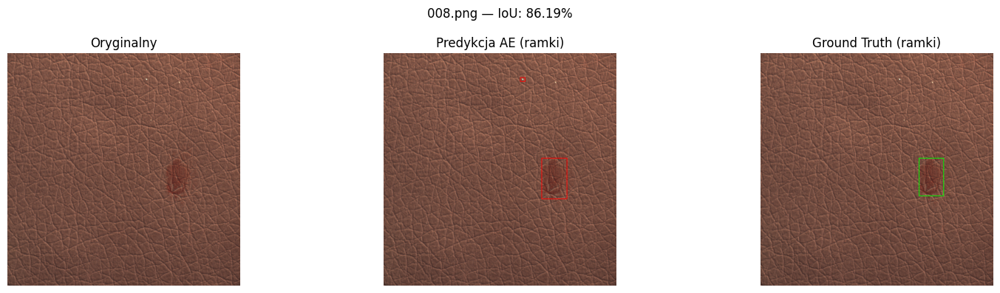

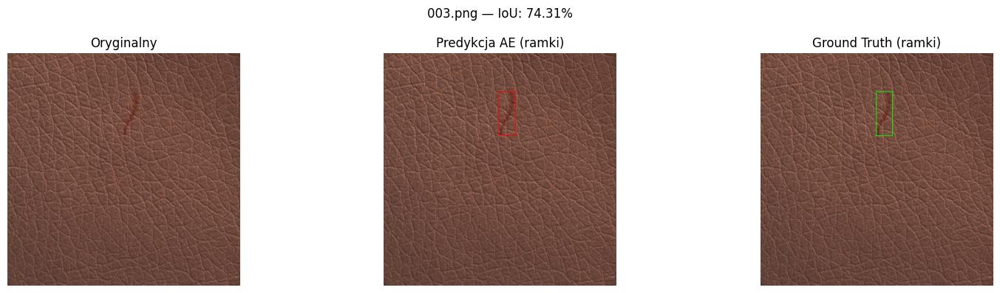

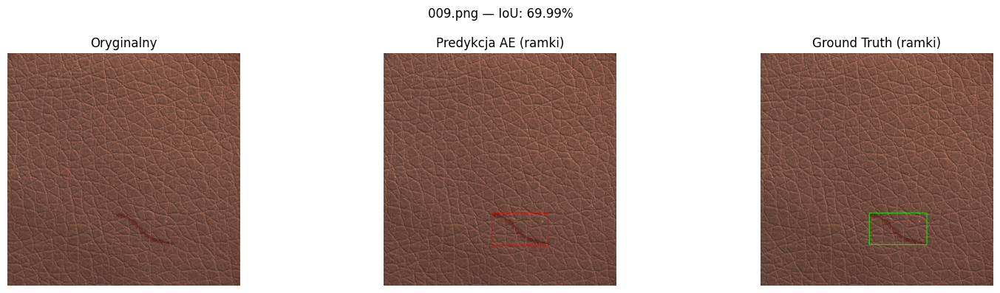

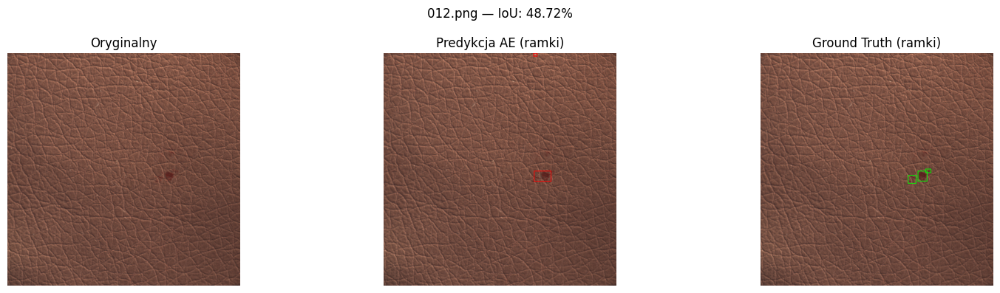

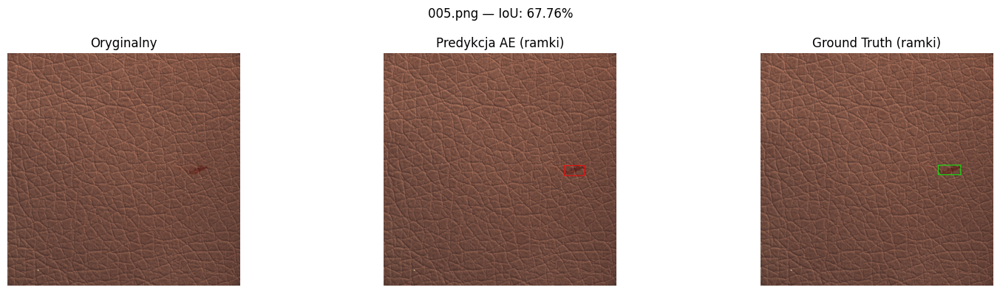

...

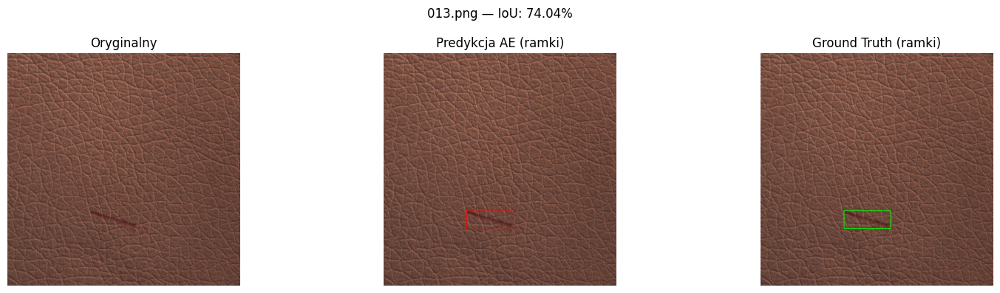

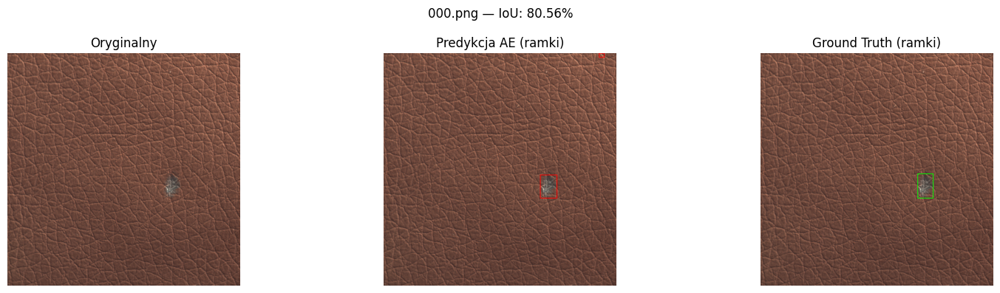

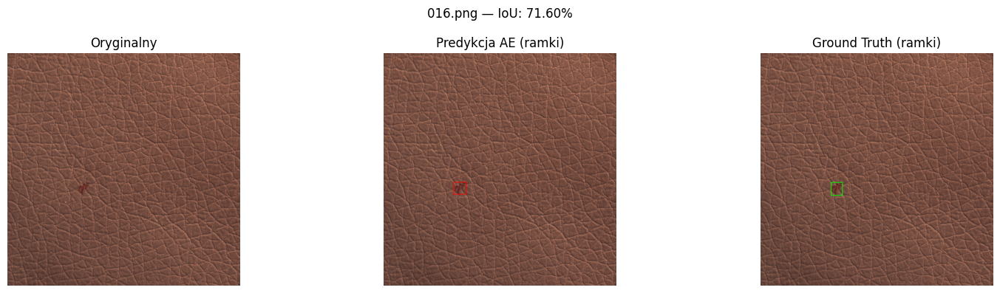

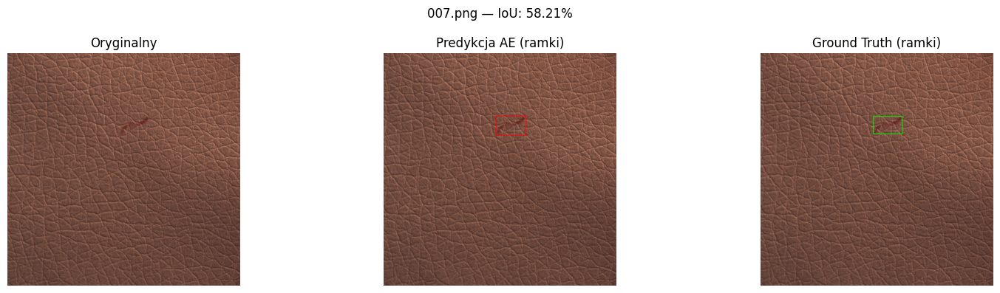

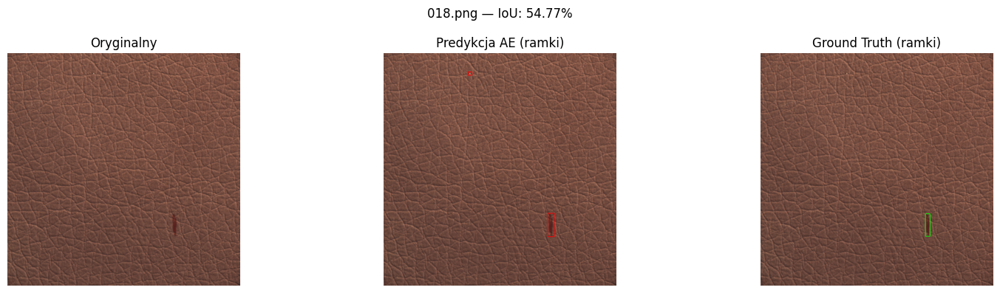

[PODSUMOWANIE] Średnie pokrycie z ground truth: 67.32%
Precision: 0.7428
Recall: 0.8800
F1 - score: 0.7878
Accuracy: 0.9983


In [7]:
detect_defects('leather/test/color', 'leather/ground_truth/color', True)

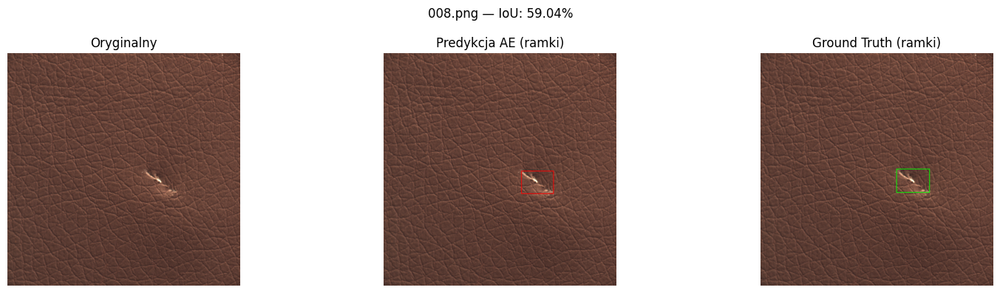

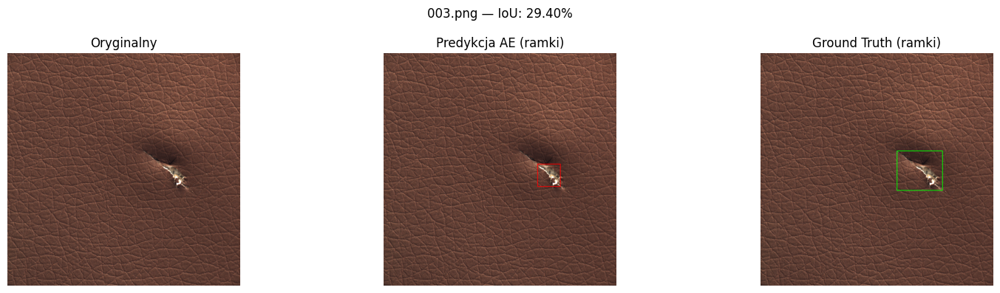

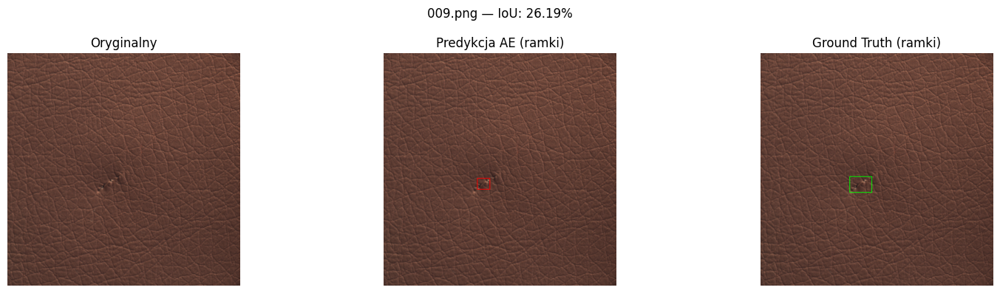

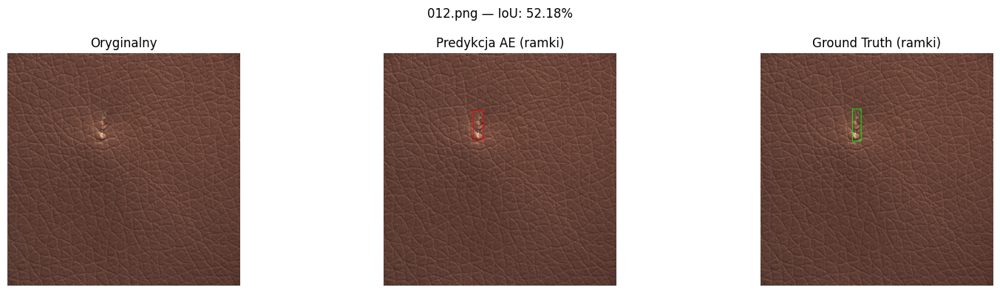

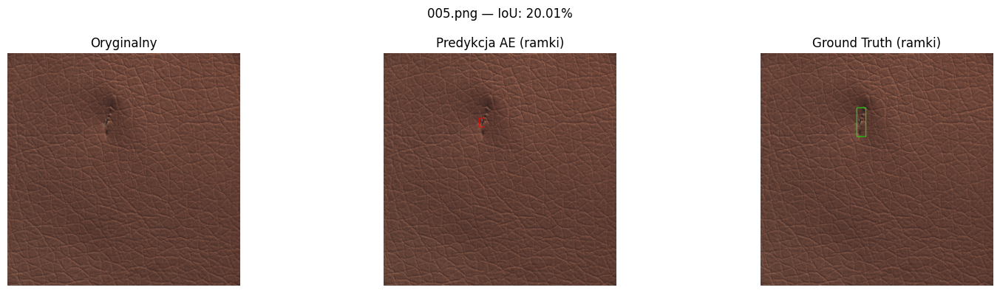

...

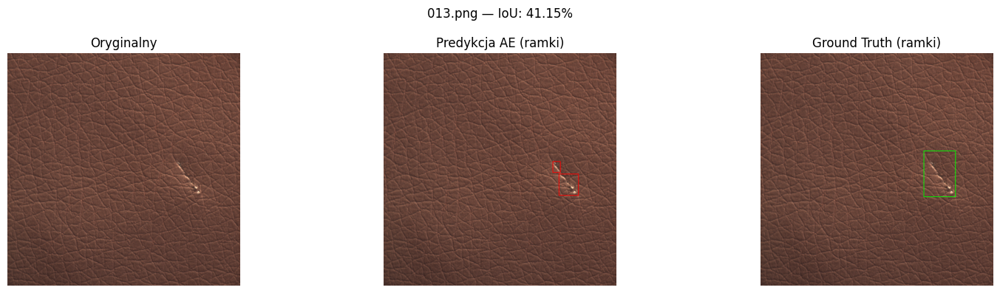

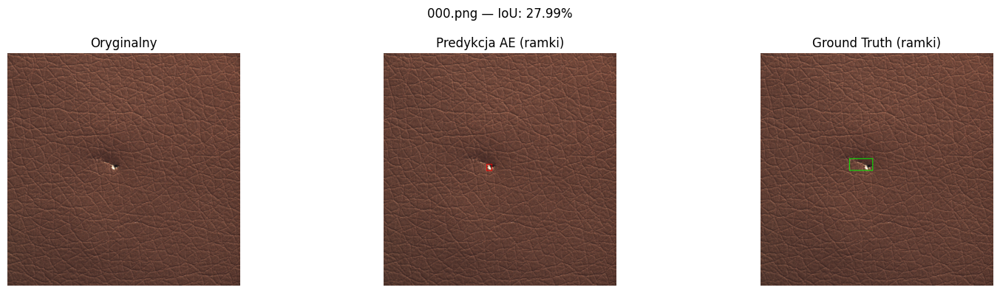

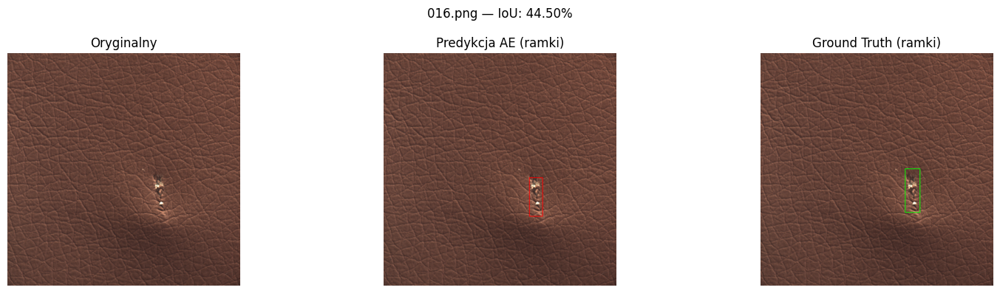

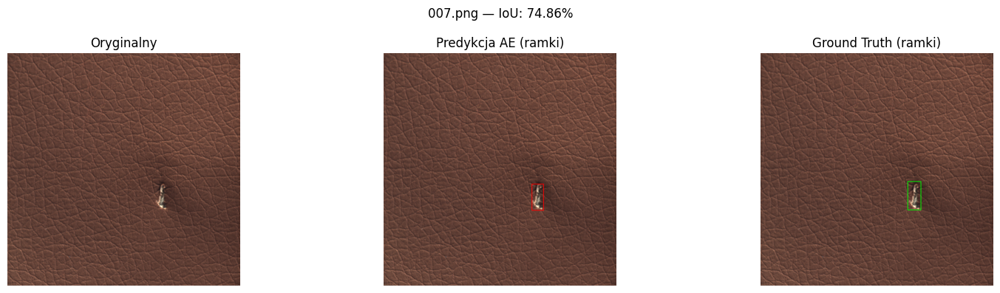

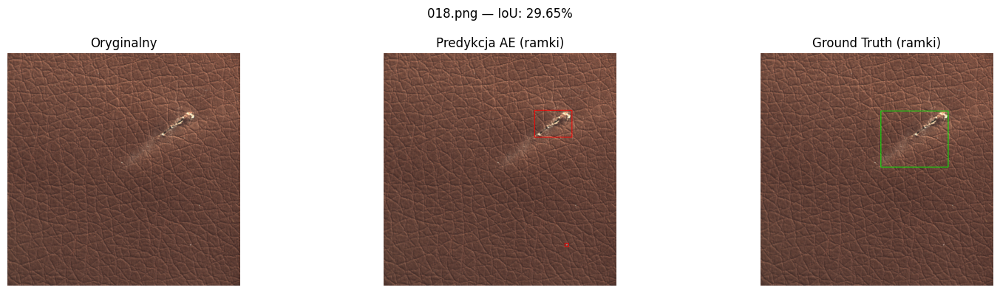

[PODSUMOWANIE] Średnie pokrycie z ground truth: 32.61%
Precision: 0.7593
Recall: 0.3185
F1 - score: 0.4178
Accuracy: 0.9964


In [8]:
detect_defects('leather/test/cut', 'leather/ground_truth/cut')

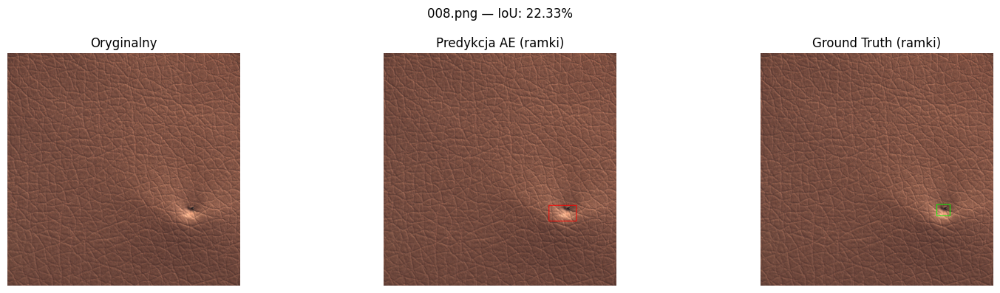

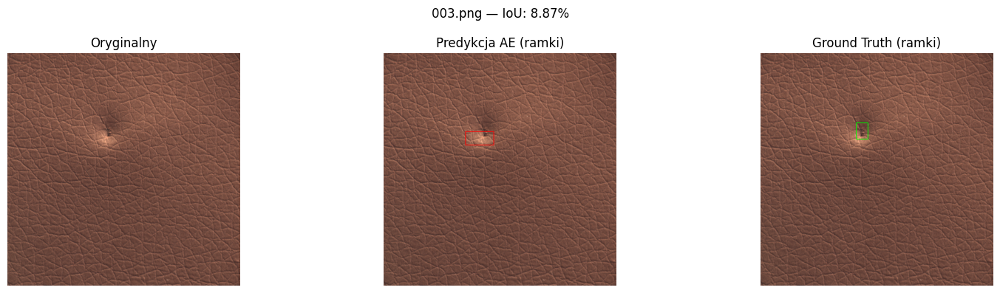

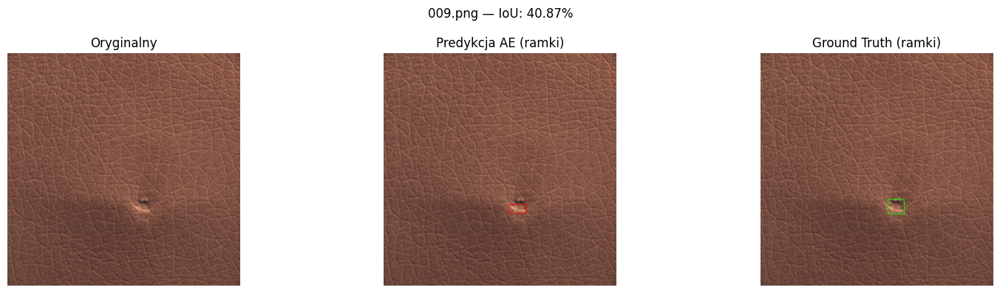

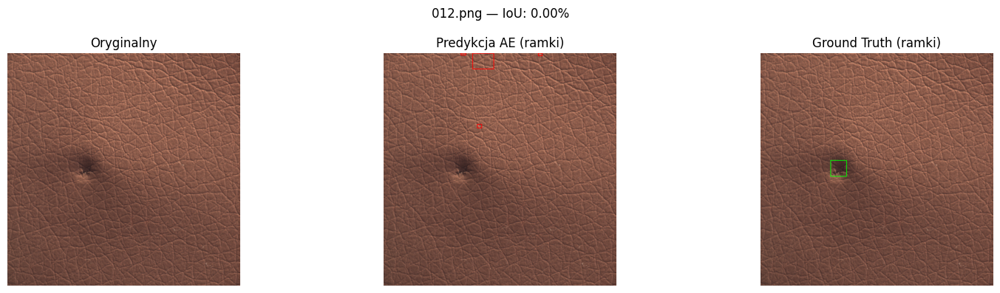

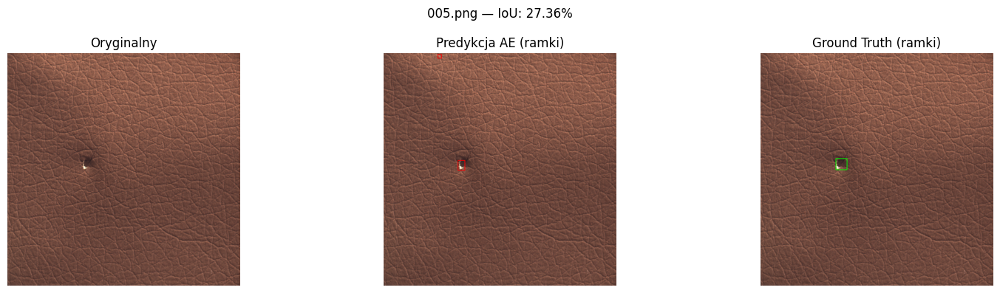

...

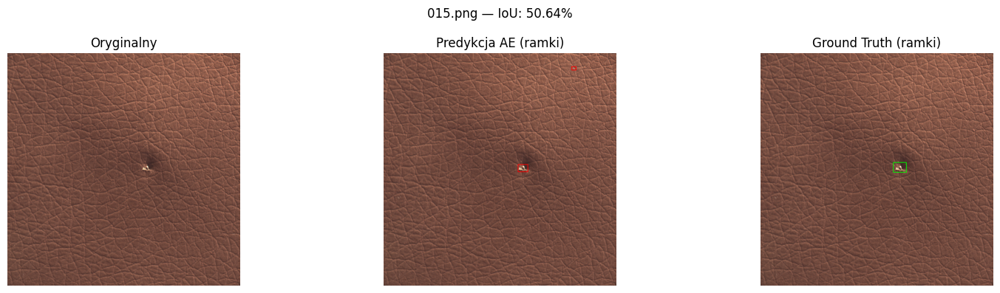

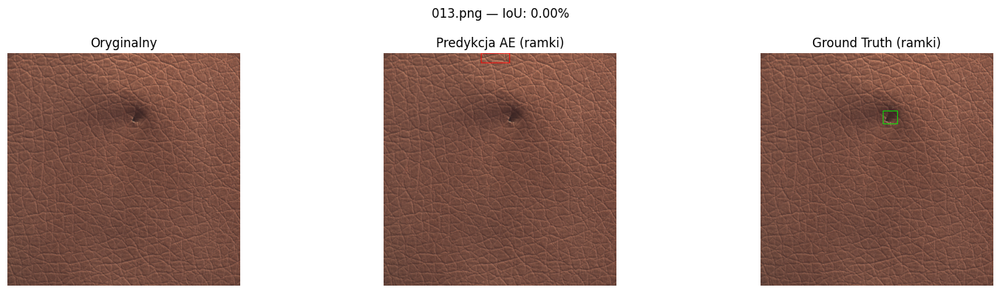

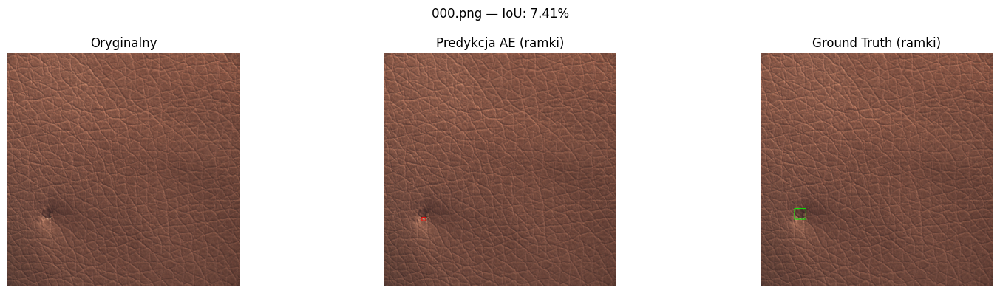

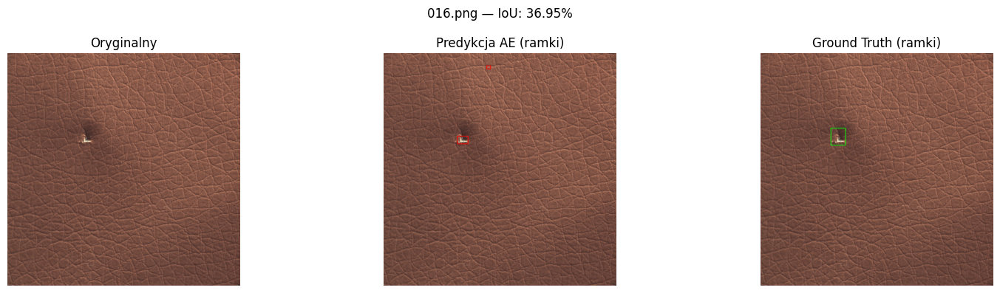

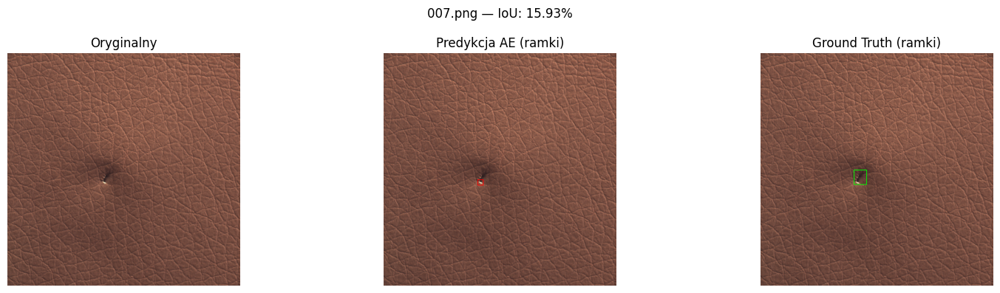

[PODSUMOWANIE] Średnie pokrycie z ground truth: 21.28%
Precision: 0.5567
Recall: 0.3035
F1 - score: 0.3507
Accuracy: 0.9974


In [9]:
detect_defects('leather/test/poke', 'leather/ground_truth/poke')